In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import folium
import math
import plotly.graph_objects as go
import plotly.express as px
import eli5
import graphviz
import networkx as nx
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso,LinearRegression
from eli5.sklearn import PermutationImportance
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
from sklearn.model_selection import train_test_split
from geopy.geocoders import Nominatim
from sklearn import tree
from matplotlib import pyplot as plt
from string import ascii_letters
from colorama import Fore, Back, Style
from sklearn.model_selection import ShuffleSplit

y_ = Fore.YELLOW
r_ = Fore.RED
g_ = Fore.GREEN
b_ = Fore.BLUE
m_ = Fore.MAGENTA

In [2]:
my_colors = ["#1a5eb8", "#eb3d78","#f05c59","#fc9660","#fc5da0"]
customPalette = sns.set_palette(sns.color_palette(my_colors))

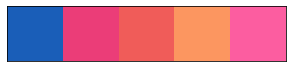

In [3]:
sns.palplot(sns.color_palette(my_colors),size=1)
plt.tick_params(axis='both', labelsize=0, length = 0)

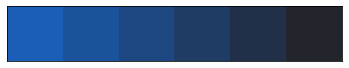

In [4]:
Mumbai = sns.dark_palette(my_colors[0], reverse=True)
sns.palplot(sns.color_palette(Mumbai),size=1)
plt.tick_params(axis='both', labelsize=0, length = 0)

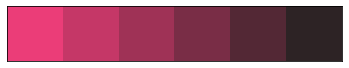

In [5]:
Delhi = sns.dark_palette(my_colors[1], reverse=True)
sns.palplot(sns.color_palette(Delhi),size=1)
plt.tick_params(axis='both', labelsize=0, length = 0)

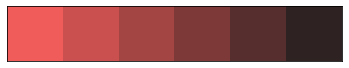

In [6]:
Chennai = sns.dark_palette(my_colors[2], reverse=True)
sns.palplot(sns.color_palette(Chennai),size=1)
plt.tick_params(axis='both', labelsize=0, length = 0)

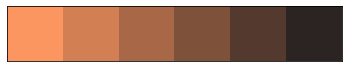

In [7]:
Banglore = sns.dark_palette(my_colors[3], reverse=True)
sns.palplot(sns.color_palette(Banglore),size=1)
plt.tick_params(axis='both', labelsize=0, length = 0)

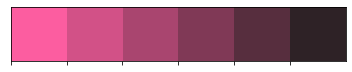

In [8]:
Hyderabad = sns.dark_palette(my_colors[4], reverse=True)
sns.palplot(sns.color_palette(Hyderabad),size=1)

In [9]:
df_combined=pd.read_csv('./Indian House Prices.csv')

# Visualization

In [10]:
# Datasets with corresponding latitude and longitude 
df_1 = pd.read_csv('./Bangalore1.csv')
df_2 = pd.read_csv('./Chennai1.csv')
df_3 = pd.read_csv('./Delhi1.csv')
df_4 = pd.read_csv('./Hyderabad1.csv')
df_5 = pd.read_csv('./Mumbai1.csv')
df_6 = pd.read_csv('./Kolkata1.csv')

Text(0.5, 1.0, 'House Price vs Area for Bangalore')

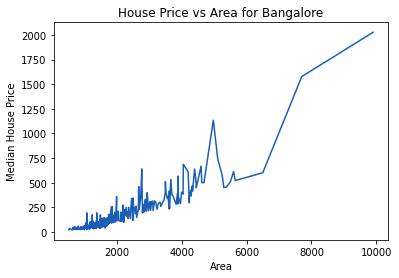

In [11]:
# Area Vs price 

# Bangalore
df_1.groupby('Area')['Price'].median().plot()
plt.xlabel('Area')
plt.ylabel('Median House Price')
plt.title("House Price vs Area for Bangalore")

Text(0.5, 1.0, 'House Price vs Area for Chennai')

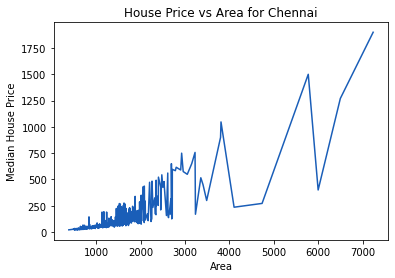

In [12]:
# Chennai

df_2.groupby('Area')['Price'].median().plot()
plt.xlabel('Area')
plt.ylabel('Median House Price')
plt.title("House Price vs Area for Chennai")

Text(0.5, 1.0, 'House Price vs Area for Delhi')

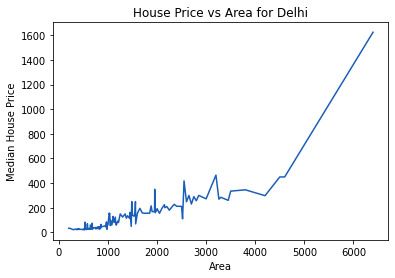

In [13]:
# Delhi

df_3.groupby('Area')['Price'].median().plot()
plt.xlabel('Area')
plt.ylabel('Median House Price')
plt.title("House Price vs Area for Delhi")

In [14]:
# Plots for Banglore

def hist_box_violin(x, title,c):
    fig, ax = plt.subplots(3,1,figsize=(20,10),sharex=True)
    sns.distplot(x, ax=ax[0],color=c)
    ax[0].set(xlabel=None)
    ax[0].set_title('Histogram + KDE')
    sns.boxplot(x, ax=ax[1],color=c)
    ax[1].set(xlabel=None)
    ax[1].set_title('Boxplot')
    sns.violinplot(x, ax=ax[2],color=c)
    ax[2].set(xlabel=None)
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.tight_layout(pad=3.0)
    plt.show()

C:\Users\Kushagra Singh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Kushagra Singh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Kushagra Singh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinter

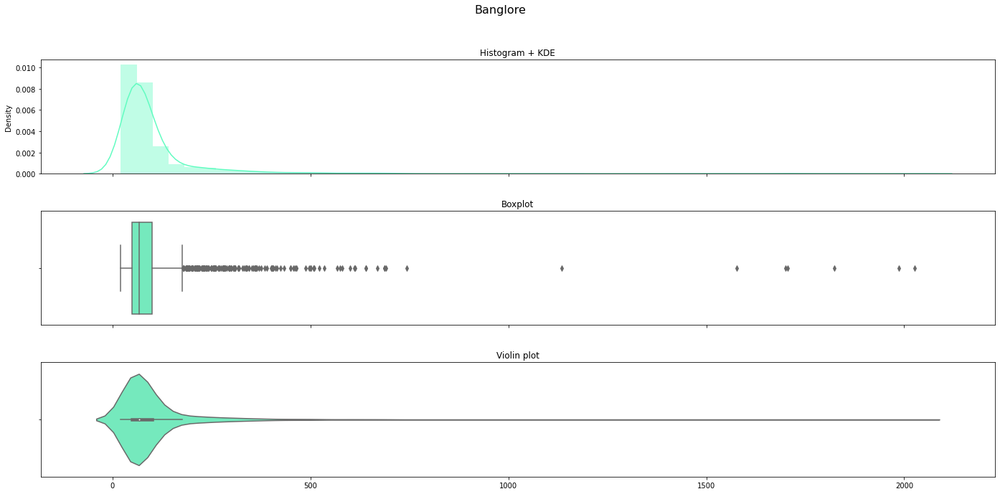

In [15]:
# Banglore
hist_box_violin(df_1['Price'],"Banglore","#62fcc1")

C:\Users\Kushagra Singh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Kushagra Singh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Kushagra Singh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinter

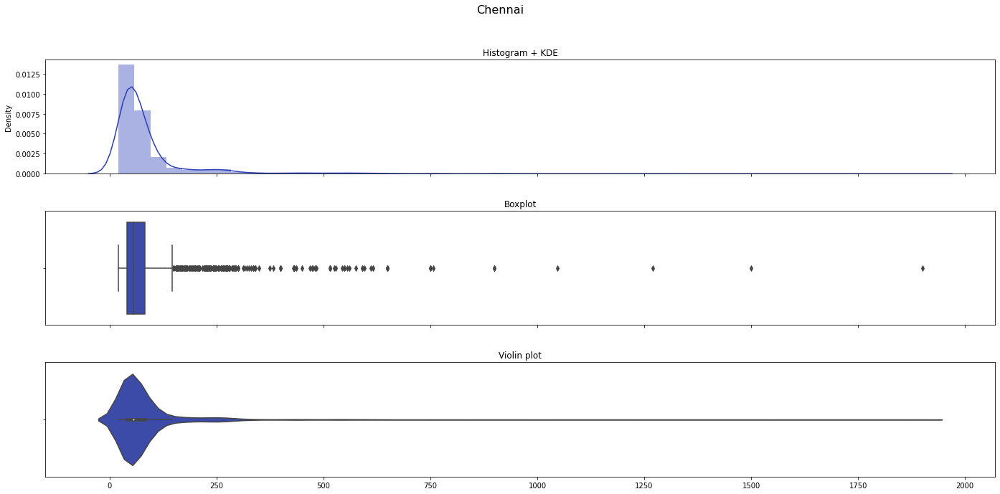

In [16]:
# Chennai
hist_box_violin(df_2['Price'],"Chennai","#2b3eba")

In [17]:
# hist_box_violin(df_combined[df_combined.City == "Kolkata"]['Price'],"Kolkata","#62fcc1")

## Analysing Resale in particular areas of a city 

In [18]:
def resale_counts(data,graph_title,city):
    df5=data[data['Resale']== 0]
    df6=data[data['Resale']== 1]
    fig, ax = plt.subplots(1,2,figsize=(15, 10))
    ax[0]=sns.countplot(y='Location', data=df5, order=df5.Location.value_counts().index[:10],ax=ax[0],palette = city)
    ax[0].set_title('Number of New Properties')
    ax[1]=sns.countplot(y='Location', data=df6, order=df6.Location.value_counts().index[:10],ax=ax[1],palette = city)
    ax[1].set_title('Number of Resale Properties')   
    
    fig.suptitle(graph_title, fontsize=16)
    plt.tight_layout(pad=3.0)
    plt.show()


### Bangalore

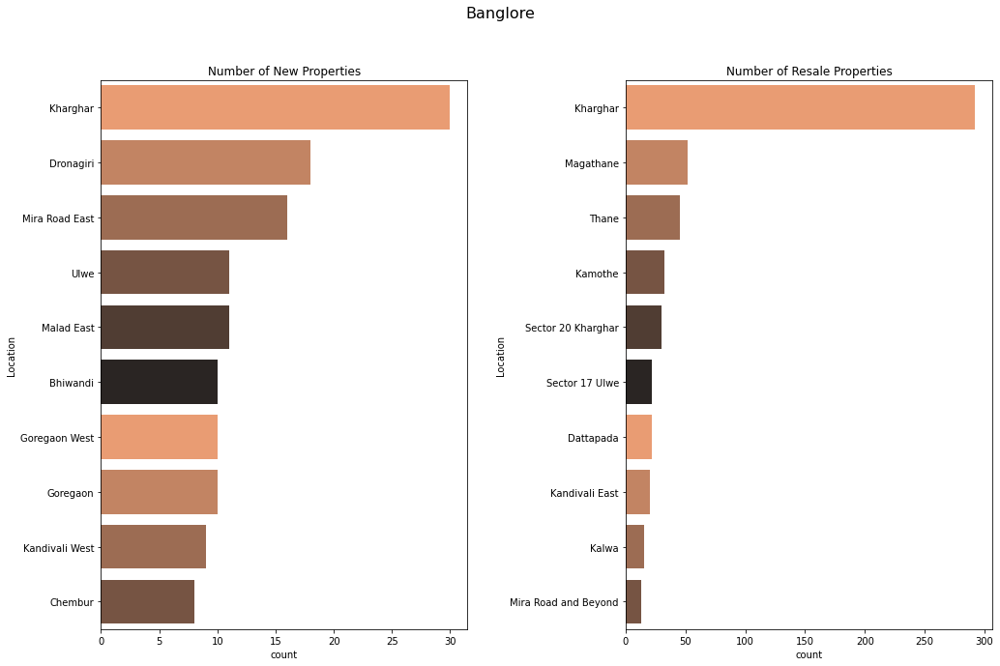

In [19]:
resale_counts(df_5,"Banglore",Banglore)

### Delhi

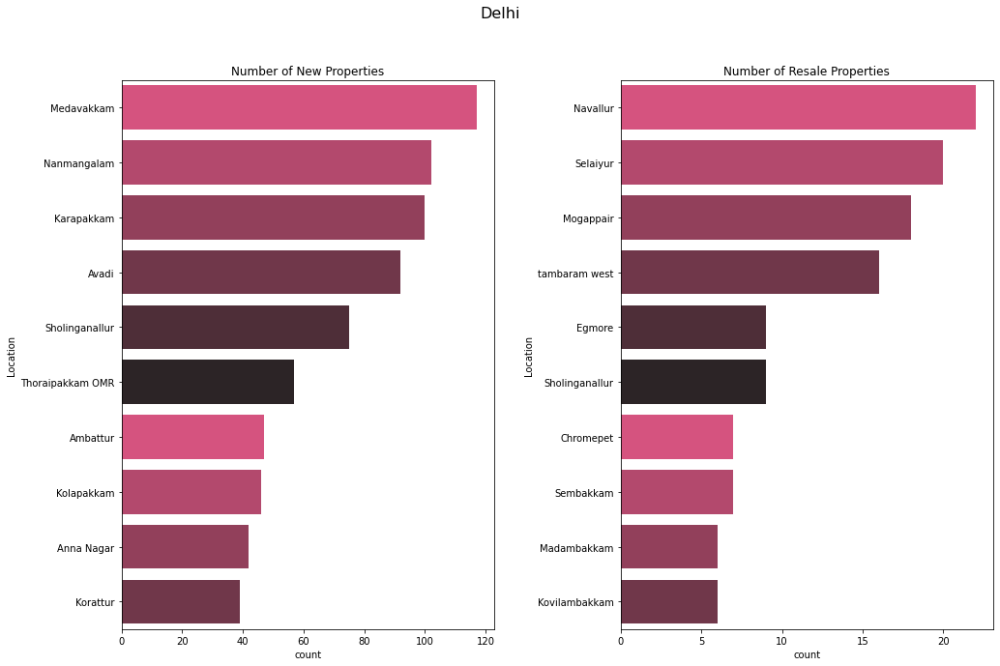

In [20]:
resale_counts(df_2,"Delhi",Delhi)

In [21]:
def preprocess(df) :
    df = df[['Location','Latitude','Longitude','Price']]
    df = df.replace('NA', np.nan)
    df.dropna(subset=['Latitude'], inplace=True)
    df.dropna(subset=['Price'], inplace=True)
    df["Latitude"] = df["Latitude"].astype(float)
    df["Longitude"] = df["Longitude"].astype(float)
    return df

In [22]:
map1_df = preprocess(df_1) # Banglore
map2_df = preprocess(df_2) # Chennai
map3_df = preprocess(df_3) # Delhi
map4_df = preprocess(df_4) # Hyderabad
map5_df = preprocess(df_5) # Mumbai
map6_df = preprocess(df_6) # Kolkata

# Property rates on Maps

## Banglore 

In [23]:
# Bangalore
# map_view_of_city = folium.Map(location=[12.9716, 77.5946], zoom_start=11.2, tiles='Stamen Terrain')
map_view_of_city = folium.Map(location=[12.935075, 77.547444], zoom_start=11.2, tiles='Stamen Terrain')

mc = MarkerCluster()
for idx, row in map1_df.iterrows():
    if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
        popup = """
        Location : <b>%s</b><br>
        Price : <b>%s</b><br>
        """ % (row['Location'], row['Price'])
        mc.add_child(Marker([row['Latitude'], row['Longitude']],tooltip=popup))
    map_view_of_city.add_child(mc)
map_view_of_city

## Chennai

In [24]:
# Chennai
map_view_of_city = folium.Map(location=[13.0827, 80.2707], zoom_start=11.2, tiles='Stamen Terrain')
mc = MarkerCluster()
for idx, row in map2_df.iterrows():
    if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
        popup = """
        Location : <b>%s</b><br>
        Price : <b>%s</b><br>
        """ % (row['Location'], row['Price'])
        mc.add_child(Marker([row['Latitude'], row['Longitude']],tooltip=popup))
    map_view_of_city.add_child(mc)
map_view_of_city

## Delhi

In [25]:
map_view_of_city = folium.Map(location=[28.7041, 77.1025], zoom_start=11.2, tiles='Stamen Terrain')
mc = MarkerCluster()
for idx, row in map3_df.iterrows():
    if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
        popup = """
        Location : <b>%s</b><br>
        Price : <b>%s</b><br>
        """ % (row['Location'], row['Price'])
        mc.add_child(Marker([row['Latitude'], row['Longitude']],tooltip=popup))
    map_view_of_city.add_child(mc)
map_view_of_city

## Hyderabad

In [26]:
map_view_of_city = folium.Map(location=[17.3850, 78.867], zoom_start=11.2, tiles='Stamen Terrain')
mc = MarkerCluster()
for idx, row in map4_df.iterrows():
    if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
        popup = """
        Location : <b>%s</b><br>
        Price : <b>%s</b><br>
        """ % (row['Location'], row['Price'])
        mc.add_child(Marker([row['Latitude'], row['Longitude']],tooltip=popup))
    map_view_of_city.add_child(mc)
map_view_of_city

## Mumbai

In [27]:

city_map = folium.Map(location=[19.08,72.74], zoom_start=11.2, tiles='Stamen Terrain')
mc = MarkerCluster()
for idx, row in map5_df.iterrows():
    if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
        popup = """
        Location : <b>%s</b><br>
        Price : <b>%s</b><br>
        """ % (row['Location'], row['Price'])
        mc.add_child(Marker([row['Latitude'], row['Longitude']],tooltip=popup))
    city_map.add_child(mc)
city_map

## Kolkata

In [28]:

city_map = folium.Map(location=[22.5726, 88.3639], zoom_start=11.2, tiles='Stamen Terrain')
mc = MarkerCluster()
for idx, row in map6_df.iterrows():
    if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
        popup = """
        Location : <b>%s</b><br>
        Price : <b>%s</b><br>
        """ % (row['Location'], row['Price'])
        mc.add_child(Marker([row['Latitude'], row['Longitude']],tooltip=popup))
    city_map.add_child(mc)
city_map

### Number of Bedrooms vs Price

In [29]:
def categorical_plot(dataset,graph_title,p):
    sns.catplot(x="No. of Bedrooms", y="Price", data=dataset,palette = p)
    plt.title('Number of Bedrooms vs Price in '+ graph_title,size=16)
    plt.gcf().set_size_inches(6,8)
    plt.show()

### Banglore

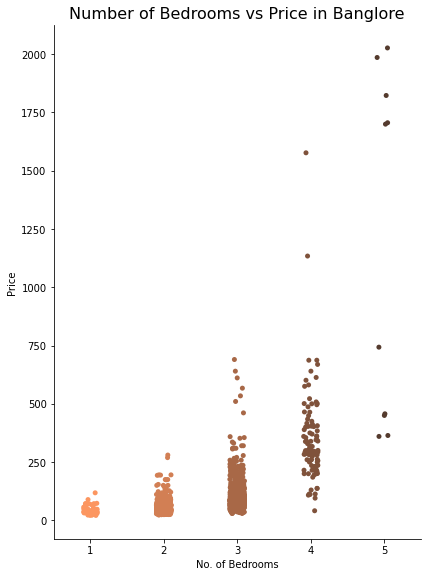

In [30]:
categorical_plot(df_1,"Banglore",Banglore)

### Chennai 

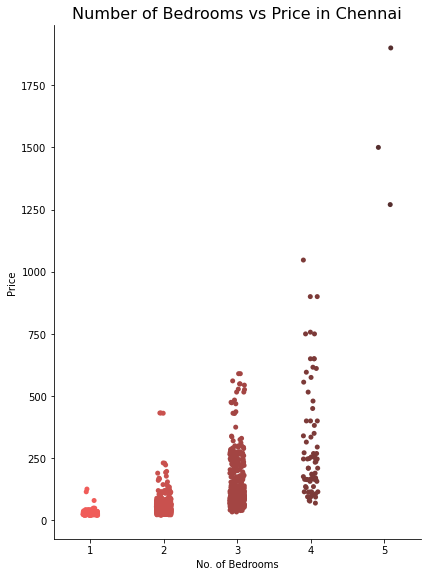

In [31]:
categorical_plot(df_2,"Chennai",Chennai)

### Chennai

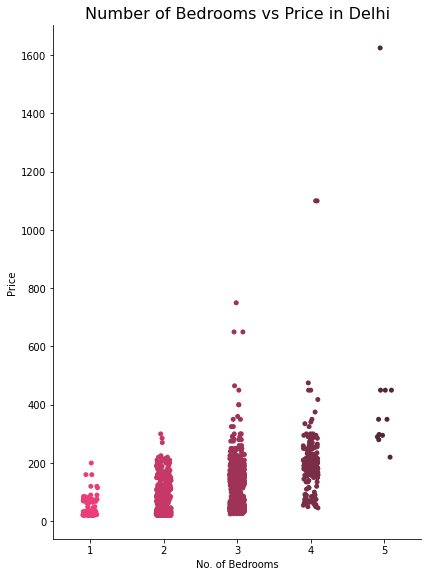

In [32]:
categorical_plot(df_3,"Delhi",Delhi)

### Hyderabad

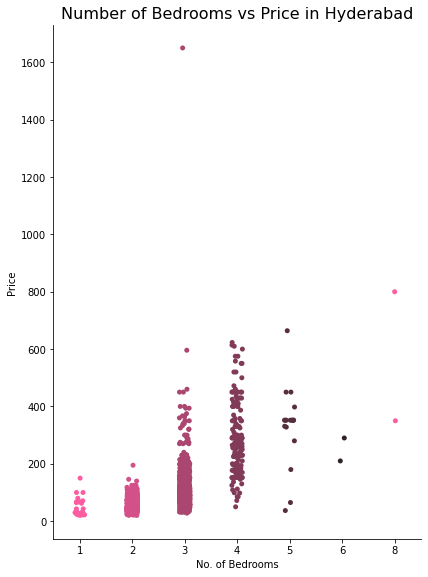

In [33]:
categorical_plot(df_4,"Hyderabad",Hyderabad)

### Banglore

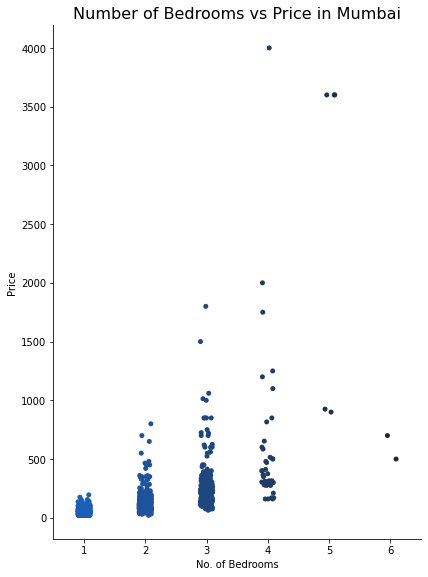

In [34]:
categorical_plot(df_5,"Mumbai",Mumbai)

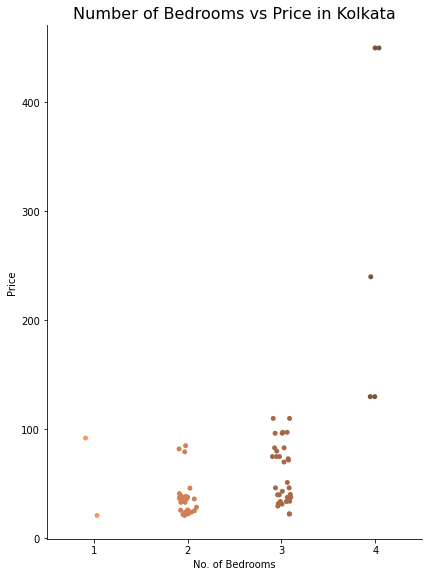

In [35]:
categorical_plot(df_6,"Kolkata",Banglore)

## Pie-Chart based on Amenitites

In [36]:

def pie_chart(df,image_src,c,addAll = True):
    df = df.iloc [:,5:-2] 
    fig = go.Figure()
    for column in df.columns.to_list():
        val = df[column].value_counts().rename_axis('unique_values').reset_index(name='val_count')
        labels = val['unique_values']
        values = val['val_count']
        fig.add_trace(
            go.Pie(
                labels=labels, 
                values=values,
                marker_colors=c
            )
        )
        button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': df.columns.isin(df.columns),
                               'title': 'All',
                               'showlegend':True}])


    def create_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': df.columns.isin([column]),
                             'title': column,
                             'showlegend': True}])
    fig.add_layout_image(
    dict(
        source=image_src,
        xref="paper", yref="paper",
        x=0.5, y=0.95,
        sizex=0.9, sizey=0.6,
        xanchor="center", yanchor="bottom"
    )
    )
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(df.columns.map(lambda column: create_layout_button(column)))
            )
        ])
    fig.show()

c1 = ["#1f89cc","#d1eeff"]
c2 = ["#ff5790","#edadc2"]
c3 = ["#f55753","#fac6c5"]
c4 = ["#ffa372","#f7ded0"]

### Banglore

In [37]:
pie_chart(df_1,"./banglore.png",c1)

### Chennai

In [38]:
pie_chart(df_2,"./Chennai.png",c2)

### Delhi

In [39]:
pie_chart(df_3,"./Delhi.png",c3)

### Hyderabad

In [40]:
pie_chart(df_4,"./Hyderabad.png",c3)

In [41]:
pie_chart(df_5,"./Mumbai.png",c4)

In [42]:
frames = [df_1,df_2,df_3,df_4]
merged = pd.concat(frames)
merged = merged.loc[:, ~merged.columns.str.contains('^Unnamed')]

In [43]:
merged.columns
merged = merged.rename(columns={"Children'splayarea": "ChildrenPlayArea"})
merged = merged.dropna()

Correlation between Features
<div>  
<h3><center style="background-color:#4fb3c9; color:white; padding : 5px 0"><strong>Correlation between Features
</strong></center></h3>
</div>

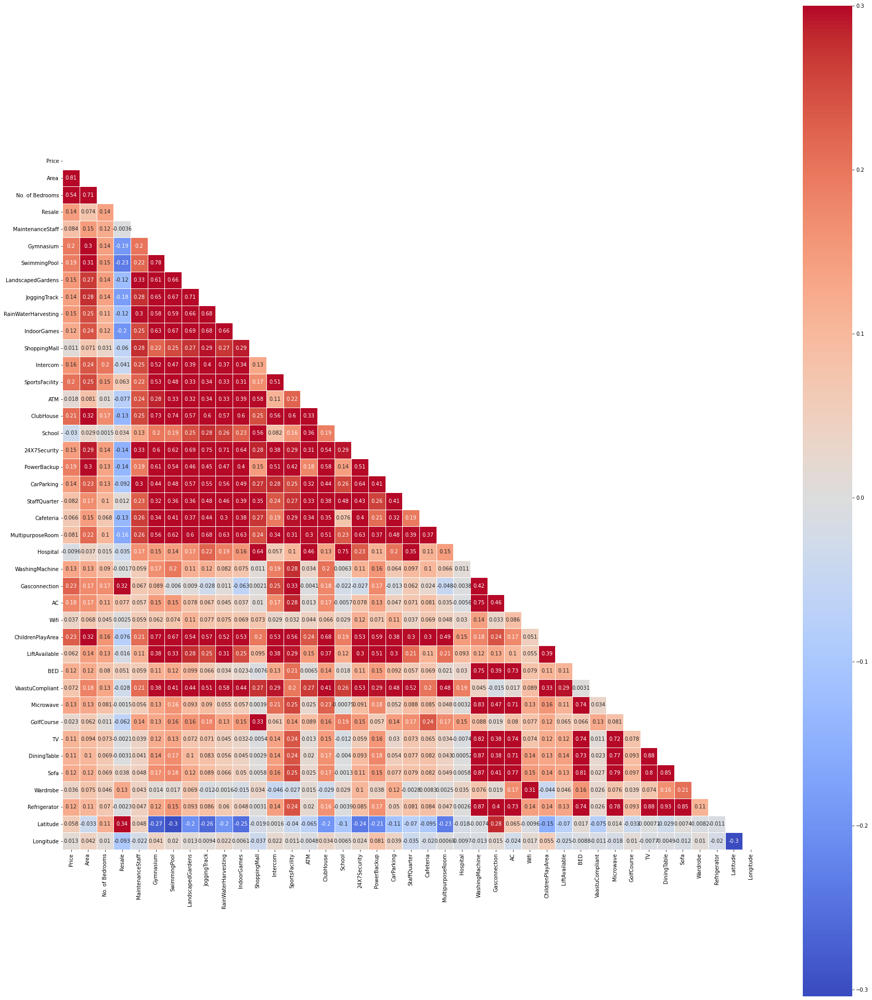

In [44]:
plt.figure(figsize=(30,35))
corr=merged.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(merged.corr(), mask=mask, cmap='coolwarm', vmax=.3, center=0,
            square=True, linewidths=.5,annot=True)
plt.show()

# Area and Price have high correlation, they are highly dependent on each other


In [45]:
merged.columns

Index(['Price', 'Area', 'Location', 'No. of Bedrooms', 'Resale',
       'MaintenanceStaff', 'Gymnasium', 'SwimmingPool', 'LandscapedGardens',
       'JoggingTrack', 'RainWaterHarvesting', 'IndoorGames', 'ShoppingMall',
       'Intercom', 'SportsFacility', 'ATM', 'ClubHouse', 'School',
       '24X7Security', 'PowerBackup', 'CarParking', 'StaffQuarter',
       'Cafeteria', 'MultipurposeRoom', 'Hospital', 'WashingMachine',
       'Gasconnection', 'AC', 'Wifi', 'ChildrenPlayArea', 'LiftAvailable',
       'BED', 'VaastuCompliant', 'Microwave', 'GolfCourse', 'TV',
       'DiningTable', 'Sofa', 'Wardrobe', 'Refrigerator', 'City', 'Latitude',
       'Longitude'],
      dtype='object')

In [46]:
feature_names = ['Area','No. of Bedrooms', 'Resale',
       'MaintenanceStaff', 'Gymnasium', 'SwimmingPool', 'LandscapedGardens',
       'JoggingTrack', 'RainWaterHarvesting', 'IndoorGames', 'ShoppingMall',
       'Intercom', 'SportsFacility', 'ATM', 'ClubHouse', 'School',
       '24X7Security', 'PowerBackup', 'CarParking', 'StaffQuarter',
       'Cafeteria', 'MultipurposeRoom', 'Hospital', 'WashingMachine',
       'Gasconnection', 'AC', 'Wifi', "Children'splayarea", 'LiftAvailable',
       'BED', 'VaastuCompliant', 'Microwave', 'GolfCourse', 'TV',
       'DiningTable', 'Sofa', 'Wardrobe', 'Refrigerator','Latitude','Longitude']


In [47]:
def find_best_model_using_gridsearchcv(X,y):
    algos = {
        'linear_regression' : {
            'model': LinearRegression(),
            'params': {
                'normalize': [True, False]
            }
        },
        'lasso': {
            'model': Lasso(),
            'params': {
                'alpha': [1,2],
                'selection': ['random', 'cyclic']
            }
        },
        'decision_tree': {
            'model': DecisionTreeRegressor(),
            'params': {
                'criterion' : ['mse','friedman_mse'],
                'splitter': ['best','random']
            }
        }
    }
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])


In [48]:

def train_model(m,name,trainX,valX,trainY,valY):
    model = m
    model.fit(X=trainX, y=trainY)
    predictions = model.predict(valX)
    mean_abs_err = mean_absolute_error(valY, predictions)
    mean_sq_err = mean_squared_error(valY,predictions) 
    r2 = r2_score(valY, predictions)
    r2 = np.round(r2,2)
    print(f"Algorithm - {name} \nMAE - {mean_abs_err} MSE - {mean_sq_err} \nAccuracy - {r2 * 100}%")
    


# <center> Banglore </center>

In [49]:
X_banglore_feature = df_1[feature_names]
y_banglore_feature = df_1['Price']

In [50]:
train_X_banglore, val_X_banglore, train_y_banglore, val_y_banglore = train_test_split(X_banglore_feature, y_banglore_feature, random_state=1)
model_banglore = RandomForestRegressor().fit(train_X_banglore,train_y_banglore)

In [51]:
model2_banglore = DecisionTreeRegressor(random_state=0, max_depth=5, min_samples_split=5).fit(train_X_banglore, train_y_banglore)

In [52]:
model3_banglore = ExtraTreesRegressor()

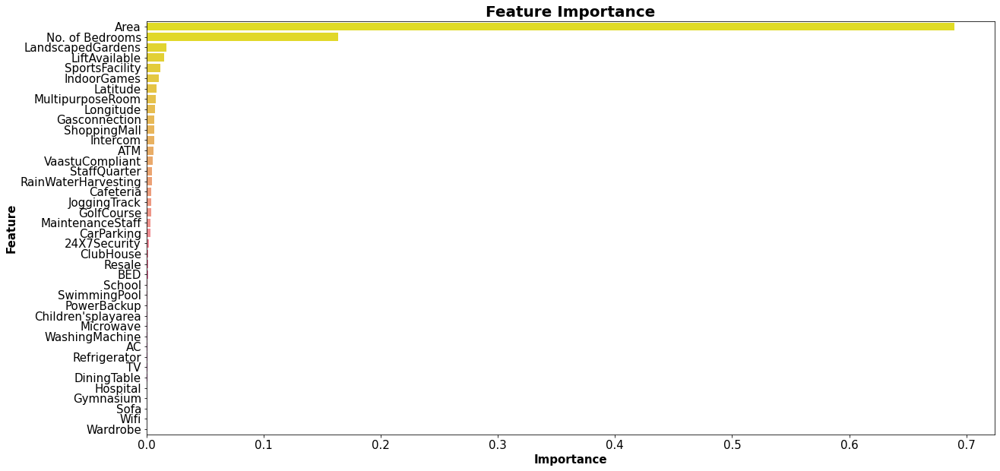

In [53]:

model3_banglore.fit(train_X_banglore, train_y_banglore)
fi = pd.DataFrame(model3_banglore.feature_importances_,
             columns=['importance'])
fi['feature'] = feature_names

fi = fi.sort_values('importance', ascending=False)

plt.figure(figsize=(20, 10))
ax = sns.barplot(data=fi, x='importance', y='feature',
                 palette="spring_r")
ax.tick_params(axis='both', which='both', labelsize=15)
ax.set_xlabel('Importance',fontsize=15, weight="bold");
ax.set_ylabel('Feature',fontsize=15,weight="bold");
plt.title("Feature Importance", size=20, weight="bold");


In [54]:
feature_names_banglore = ['Area','No. of Bedrooms','Latitude','LandscapedGardens','LiftAvailable','Longitude']
df_1[feature_names_banglore]

,Area,No. of Bedrooms,Latitude,LandscapedGardens,LiftAvailable,Longitude
0,3340,4,12.265594,1,1,76.646540
1,1675,3,12.971319,0,1,77.696477
2,1670,3,12.917657,1,1,77.483757
3,1220,2,13.027331,1,1,77.660151
4,2502,4,13.054713,1,1,77.633926
...,...,...,...,...,...,...
1703,1184,2,12.870540,1,1,77.654085
1704,655,1,12.870540,1,1,77.654085
1705,1680,3,12.870540,1,1,77.654085
1706,1195,2,12.870540,1,1,77.654085


In [55]:
df_1=df_1.loc[:, ~df_1.columns.str.contains('^Unnamed')]
# dataframe1 = df_1.drop([
#        'MaintenanceStaff', 'Gymnasium', 'SwimmingPool', 'LandscapedGardens',
#        'JoggingTrack', 'RainWaterHarvesting', 'IndoorGames', 'ShoppingMall',
#        'Intercom', 'SportsFacility', 'ATM','Cafeteria', 'ClubHouse', 'School',
#        '24X7Security', 'PowerBackup', 'CarParking', 'StaffQuarter',
#         'MultipurposeRoom', 'Hospital', 'WashingMachine',
#        'Resale', 'Wifi', "Children'splayarea",'Gasconnection','TV',
#        'BED', 'Microwave', 'GolfCourse',
#        'DiningTable', 'Sofa', 'Wardrobe', 'Refrigerator', 'City','Location','LiftAvailable' ],axis='columns')

X_banglore = df_1[feature_names_banglore]
y_banglore = df_1['Price']

train_X_banglore, val_X_banglore, train_y_banglore, val_y_banglore = train_test_split(X_banglore, y_banglore, random_state=1)

train_model(DecisionTreeRegressor(),"Decision Tree Regressor",train_X_banglore, val_X_banglore, train_y_banglore, val_y_banglore)
train_model(RandomForestRegressor(),"Random Forest Regressor",train_X_banglore, val_X_banglore, train_y_banglore, val_y_banglore)   
train_model(XGBRegressor(n_estimators=600),"XGBoost Regressor",train_X_banglore, val_X_banglore, train_y_banglore, val_y_banglore)
find_best_model_using_gridsearchcv(X_banglore,y_banglore)

Algorithm - Decision Tree Regressor 
MAE - 11.340391573445224 MSE - 1448.7633826077038 
Accuracy - 95.0%
Algorithm - Random Forest Regressor 
MAE - 10.914820191693414 MSE - 894.7247320214788 
Accuracy - 97.0%
Algorithm - XGBoost Regressor 
MAE - 8.607018443210432 MSE - 670.5925374576406 
Accuracy - 98.0%


,model,best_score,best_params
0,linear_regression,0.823827,{'normalize': True}
1,lasso,0.824605,"{'alpha': 1, 'selection': 'random'}"
2,decision_tree,0.903509,"{'criterion': 'mse', 'splitter': 'best'}"


# <center> Chennai </center>

In [56]:
X_chennai_feature = df_2[feature_names]
y_chennai_feature = df_2['Price']

In [57]:
train_X_chennai, val_X_chennai, train_y_chennai, val_y_chennai = train_test_split(X_chennai_feature, y_chennai_feature, random_state=1)
model = RandomForestRegressor().fit(train_X_chennai,train_y_chennai)

In [58]:
model2 = DecisionTreeRegressor(random_state=0, max_depth=5, min_samples_split=5).fit(train_X_chennai, train_y_chennai)

In [59]:
model3 = ExtraTreesRegressor()

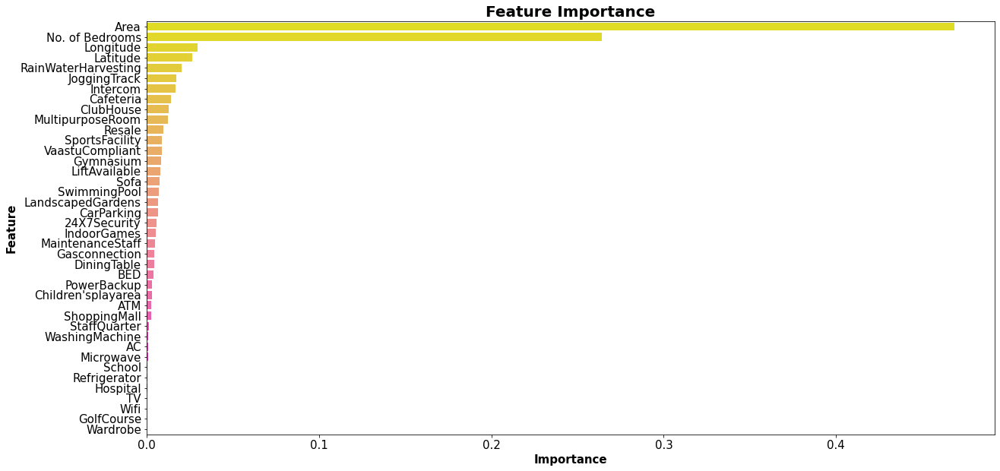

In [60]:

model3.fit(train_X_chennai, train_y_chennai)
fi = pd.DataFrame(model3.feature_importances_,
             columns=['importance'])
fi['feature'] = feature_names

fi = fi.sort_values('importance', ascending=False)

plt.figure(figsize=(20, 10))
ax = sns.barplot(data=fi, x='importance', y='feature',
                 palette="spring_r")
ax.tick_params(axis='both', which='both', labelsize=15)
ax.set_xlabel('Importance',fontsize=15, weight="bold");
ax.set_ylabel('Feature',fontsize=15,weight="bold");
plt.title("Feature Importance", size=20, weight="bold");


In [61]:
feature_names_chennai = ['Area','No. of Bedrooms','RainWaterHarvesting','Intercom','Latitude','Longitude']
df_2[feature_names_chennai]

,Area,No. of Bedrooms,RainWaterHarvesting,Intercom,Latitude,Longitude
0,1310,3,0,0,12.914545,80.087955
1,1126,2,1,0,13.142931,80.232517
2,1307,3,1,1,12.911707,80.227720
3,576,1,1,1,13.028020,80.007207
4,1207,3,1,1,13.009707,80.152899
...,...,...,...,...,...,...
2042,872,2,0,0,13.112886,80.159862
2043,1540,3,0,0,13.087200,80.216442
2044,1200,3,0,0,13.019370,80.243551
2045,1375,3,0,1,13.087200,80.216442


In [62]:
df_2=df_2.loc[:, ~df_2.columns.str.contains('^Unnamed')]
# dataframe1 = df_1.drop([
#        'MaintenanceStaff', 'Gymnasium', 'SwimmingPool', 'LandscapedGardens',
#        'JoggingTrack', 'RainWaterHarvesting', 'IndoorGames', 'ShoppingMall',
#        'Intercom', 'SportsFacility', 'ATM','Cafeteria', 'ClubHouse', 'School',
#        '24X7Security', 'PowerBackup', 'CarParking', 'StaffQuarter',
#         'MultipurposeRoom', 'Hospital', 'WashingMachine',
#        'Resale', 'Wifi', "Children'splayarea",'Gasconnection','TV',
#        'BED', 'Microwave', 'GolfCourse',
#        'DiningTable', 'Sofa', 'Wardrobe', 'Refrigerator', 'City','Location','LiftAvailable' ],axis='columns')

X_chennai = df_2[feature_names_chennai]
y_chennai = df_2['Price']

train_X_chennai, val_X_chennai, train_y_chennai, val_y_chennai = train_test_split(X_chennai, y_chennai, random_state=1)

train_model(DecisionTreeRegressor(),"Decision Tree Regressor",train_X_chennai, val_X_chennai, train_y_chennai, val_y_chennai)
train_model(RandomForestRegressor(),"Random Forest Regressor",train_X_chennai, val_X_chennai, train_y_chennai, val_y_chennai)   
train_model(XGBRegressor(n_estimators=600),"XGBoost Regressor",train_X_chennai, val_X_chennai, train_y_chennai, val_y_chennai)
find_best_model_using_gridsearchcv(X_chennai,y_chennai)

Algorithm - Decision Tree Regressor 
MAE - 11.693699693080358 MSE - 1292.9253300330588 
Accuracy - 89.0%
Algorithm - Random Forest Regressor 
MAE - 9.882559211971746 MSE - 661.6427189829095 
Accuracy - 94.0%
Algorithm - XGBoost Regressor 
MAE - 8.853638227933647 MSE - 688.699171672042 
Accuracy - 94.0%


,model,best_score,best_params
0,linear_regression,0.647553,{'normalize': True}
1,lasso,0.645167,"{'alpha': 1, 'selection': 'cyclic'}"
2,decision_tree,0.924784,"{'criterion': 'friedman_mse', 'splitter': 'best'}"


# <center> Delhi </center>

In [63]:
X_delhi_feature = df_3[feature_names]
y_delhi_feature = df_3['Price']

In [64]:
train_X_delhi, val_X_delhi, train_y_delhi, val_y_delhi = train_test_split(X_delhi_feature, y_delhi_feature, random_state=1)
model = RandomForestRegressor().fit(train_X_delhi,train_y_delhi)

In [65]:
model2 = DecisionTreeRegressor(random_state=0, max_depth=5, min_samples_split=5).fit(train_X_chennai, train_y_chennai)

In [66]:
model3 = ExtraTreesRegressor()

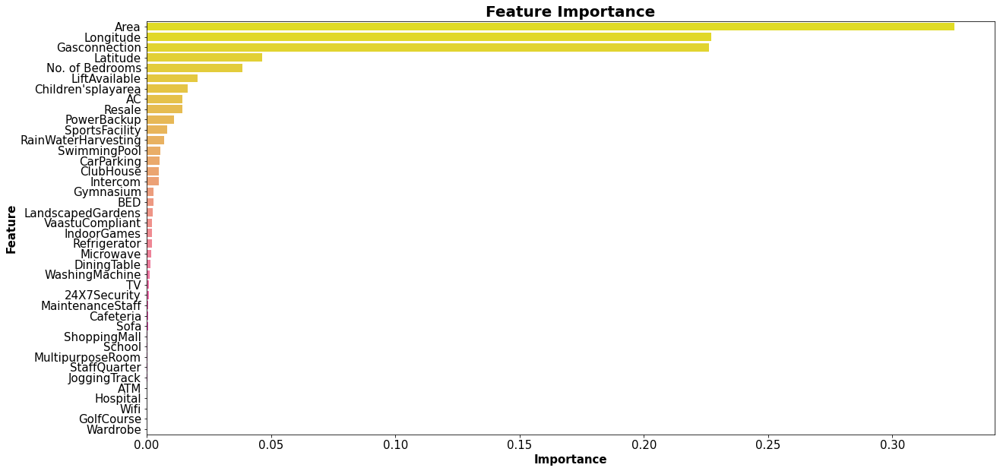

In [67]:

model3.fit(train_X_delhi, train_y_delhi)
fi = pd.DataFrame(model3.feature_importances_,
             columns=['importance'])
fi['feature'] = feature_names

fi = fi.sort_values('importance', ascending=False)

plt.figure(figsize=(20, 10))
ax = sns.barplot(data=fi, x='importance', y='feature',
                 palette="spring_r")
ax.tick_params(axis='both', which='both', labelsize=15)
ax.set_xlabel('Importance',fontsize=15, weight="bold");
ax.set_ylabel('Feature',fontsize=15,weight="bold");
plt.title("Feature Importance", size=20, weight="bold");


In [68]:
feature_names_delhi = ['Area','No. of Bedrooms','Gasconnection','LiftAvailable','Latitude','Longitude','Resale']
df_3[feature_names_delhi]

,Area,No. of Bedrooms,Gasconnection,LiftAvailable,Latitude,Longitude,Resale
0,1200,2,1,1,28.584311,77.057693,1
1,1000,3,0,0,28.619074,77.056686,0
2,1350,2,0,0,28.528574,77.288331,1
3,435,2,0,0,28.619074,77.056686,0
4,900,3,0,1,28.619310,77.033279,0
...,...,...,...,...,...,...,...
1984,1200,2,1,0,28.669578,77.095956,1
1985,1350,3,1,0,28.699512,77.130105,1
1986,1963,4,0,0,29.361405,-100.778572,1
1987,1050,2,1,0,28.542233,77.294386,1


In [69]:
df_3=df_3.loc[:, ~df_3.columns.str.contains('^Unnamed')]
# dataframe1 = df_1.drop([
#        'MaintenanceStaff', 'Gymnasium', 'SwimmingPool', 'LandscapedGardens',
#        'JoggingTrack', 'RainWaterHarvesting', 'IndoorGames', 'ShoppingMall',
#        'Intercom', 'SportsFacility', 'ATM','Cafeteria', 'ClubHouse', 'School',
#        '24X7Security', 'PowerBackup', 'CarParking', 'StaffQuarter',
#         'MultipurposeRoom', 'Hospital', 'WashingMachine',
#        'Resale', 'Wifi', "Children'splayarea",'Gasconnection','TV',
#        'BED', 'Microwave', 'GolfCourse',
#        'DiningTable', 'Sofa', 'Wardrobe', 'Refrigerator', 'City','Location','LiftAvailable' ],axis='columns')

X_delhi = df_3[feature_names_delhi]
y_delhi = df_3['Price']

train_X_delhi, val_X_delhi, train_y_delhi, val_y_delhi = train_test_split(X_delhi, y_delhi, random_state=1)


train_model(DecisionTreeRegressor(),"Decision Tree Regressor",train_X_delhi, val_X_delhi, train_y_delhi, val_y_delhi)
train_model(RandomForestRegressor(),"Random Forest Regressor",train_X_delhi, val_X_delhi, train_y_delhi, val_y_delhi)   
train_model(XGBRegressor(n_estimators=600),"XGBoost Regressor",train_X_delhi, val_X_delhi, train_y_delhi, val_y_delhi)
find_best_model_using_gridsearchcv(X_delhi,y_delhi)



Algorithm - Decision Tree Regressor 
MAE - 15.816976949364589 MSE - 1587.9334227958639 
Accuracy - 78.0%
Algorithm - Random Forest Regressor 
MAE - 13.97582516087823 MSE - 1134.3670132388734 
Accuracy - 84.0%
Algorithm - XGBoost Regressor 
MAE - 14.116111382415037 MSE - 1146.2104479573661 
Accuracy - 84.0%


,model,best_score,best_params
0,linear_regression,0.723739,{'normalize': False}
1,lasso,0.721170,"{'alpha': 1, 'selection': 'cyclic'}"
2,decision_tree,0.796388,"{'criterion': 'mse', 'splitter': 'random'}"


# <center> Hyderabad </center>

In [70]:
X_hyderabad_feature = df_4[feature_names]
y_hyderabad_feature = df_4['Price']

In [71]:
train_X_hyderabad, val_X_hyderabad, train_y_hyderabad, val_y_hyderabad = train_test_split(X_hyderabad_feature, y_hyderabad_feature, random_state=1)
model = RandomForestRegressor().fit(train_X_hyderabad,train_y_hyderabad)

In [72]:
model2 = DecisionTreeRegressor(random_state=0, max_depth=5, min_samples_split=5).fit(train_X_hyderabad, train_y_hyderabad)

In [73]:
model3 = ExtraTreesRegressor()

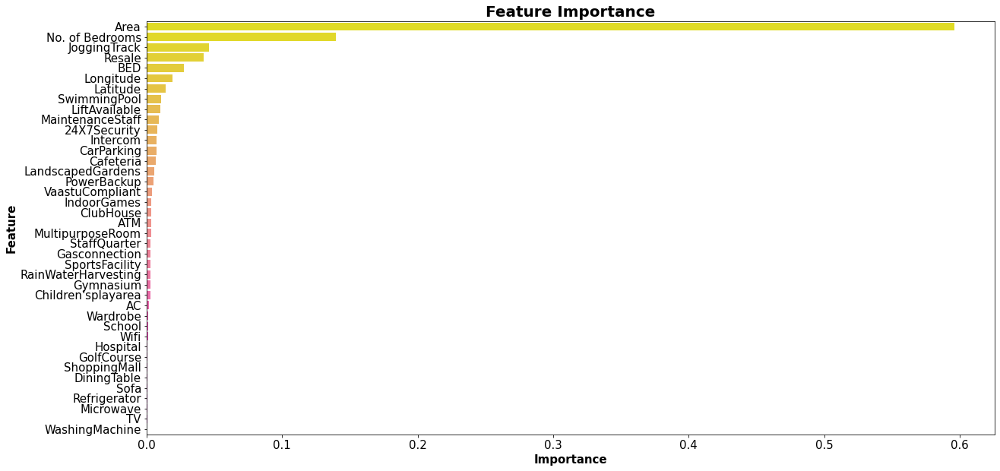

In [74]:

model3.fit(train_X_hyderabad, train_y_hyderabad)
fi = pd.DataFrame(model3.feature_importances_,
             columns=['importance'])
# print(feature_names)
# fi['feature'] = df_1.columns.tolist()
fi['feature'] = feature_names

fi = fi.sort_values('importance', ascending=False)

plt.figure(figsize=(20, 10))
ax = sns.barplot(data=fi, x='importance', y='feature',
                 palette="spring_r")
ax.tick_params(axis='both', which='both', labelsize=15)
ax.set_xlabel('Importance',fontsize=15, weight="bold");
ax.set_ylabel('Feature',fontsize=15,weight="bold");
plt.title("Feature Importance", size=20, weight="bold");

In [75]:
feature_names_hyderabad = ['Area','No. of Bedrooms','Latitude','JoggingTrack','Longitude','Resale','BED']
df_6[feature_names_hyderabad]

,Area,No. of Bedrooms,Latitude,JoggingTrack,Longitude,Resale,BED
0,1016,3,22.717624,1,88.488953,0,0
1,1111,2,22.597817,1,88.427003,0,0
2,1020,2,22.621280,0,88.485523,0,0
3,935,2,23.112575,1,89.288292,0,0
4,1956,3,55.955458,1,-3.199000,1,0
...,...,...,...,...,...,...,...
63,1200,2,22.508055,0,88.353329,1,1
64,900,3,22.621280,0,88.485523,1,0
65,750,2,22.621280,0,88.485523,1,0
66,750,2,55.955458,0,-3.199000,0,0


In [76]:
df_4=df_4.loc[:, ~df_4.columns.str.contains('^Unnamed')]
# dataframe1 = df_5.drop([
#        'MaintenanceStaff', 'Gymnasium', 'SwimmingPool', 'LandscapedGardens',
#        'JoggingTrack', 'RainWaterHarvesting', 'IndoorGames', 'ShoppingMall',
#        'Intercom', 'SportsFacility', 'ATM','Cafeteria', 'ClubHouse', 'School',
#        '24X7Security', 'PowerBackup', 'CarParking', 'StaffQuarter',
#         'MultipurposeRoom', 'Hospital', 'WashingMachine',
#        'Resale', 'Wifi', "Children'splayarea",'Gasconnection','TV',
#        'BED', 'Microwave', 'GolfCourse',
#        'DiningTable', 'Sofa', 'Wardrobe', 'Refrigerator', 'City','Location','LiftAvailable' ],axis='columns')

# X_mumbai = dataframe1.drop(['Price'],axis='columns')
# y_mumbai = dataframe1.Price

X_hyderabad = df_4[feature_names_hyderabad]
y_hyderabad = df_4['Price']

train_X_hyderabad, val_X_hyderabad, train_y_hyderabad, val_y_hyderabad = train_test_split(X_hyderabad, y_hyderabad, random_state=1)

train_model(DecisionTreeRegressor(),"Decision Tree Regressor",train_X_hyderabad, val_X_hyderabad, train_y_hyderabad, val_y_hyderabad )
train_model(RandomForestRegressor(),"Random Forest Regressor",train_X_hyderabad, val_X_hyderabad, train_y_hyderabad, val_y_hyderabad )   
train_model(XGBRegressor(n_estimators=600),"XGBoost Regressor",train_X_hyderabad, val_X_hyderabad, train_y_hyderabad, val_y_hyderabad )
find_best_model_using_gridsearchcv(X_hyderabad,y_hyderabad)


Algorithm - Decision Tree Regressor 
MAE - 20.568602092961495 MSE - 5869.705193638553 
Accuracy - 28.999999999999996%
Algorithm - Random Forest Regressor 
MAE - 17.100485067888822 MSE - 2519.6855188419095 
Accuracy - 70.0%
Algorithm - XGBoost Regressor 
MAE - 17.68692466891914 MSE - 3185.2219468897733 
Accuracy - 62.0%


,model,best_score,best_params
0,linear_regression,0.631328,{'normalize': False}
1,lasso,0.628926,"{'alpha': 1, 'selection': 'cyclic'}"
2,decision_tree,0.610437,"{'criterion': 'mse', 'splitter': 'random'}"


# <center> Mumbai </center>

In [77]:
X_mumbai_feature = df_5[feature_names]
y_mumbai_feature = df_5['Price']

In [78]:
train_X_mumbai, val_X_mumbai, train_y_mumbai, val_y_mumbai = train_test_split(X_mumbai_feature, y_mumbai_feature, random_state=1)
model = RandomForestRegressor().fit(train_X_mumbai,train_y_mumbai)

In [79]:
model2 = DecisionTreeRegressor(random_state=0, max_depth=5, min_samples_split=5).fit(train_X_mumbai, train_y_mumbai)

In [80]:
model3 = ExtraTreesRegressor()

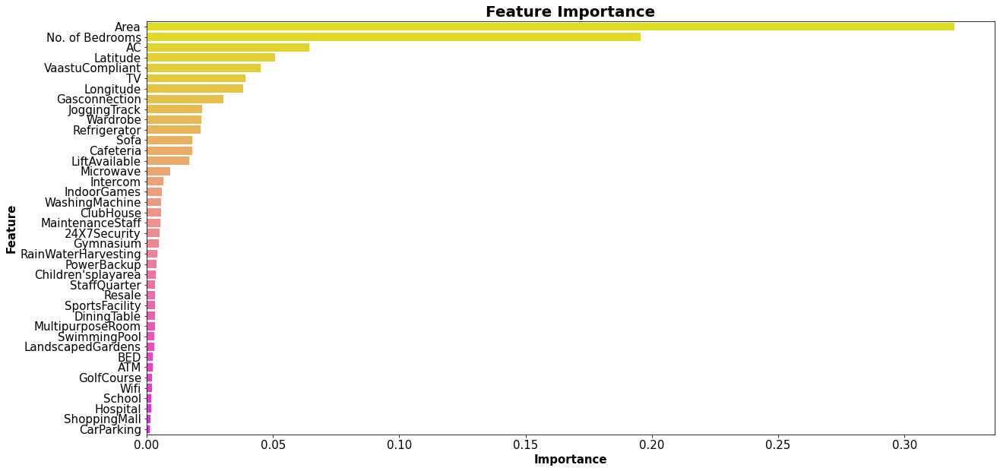

In [81]:

model3.fit(train_X_mumbai, train_y_mumbai)
fi = pd.DataFrame(model3.feature_importances_,
             columns=['importance'])
# print(feature_names)
# fi['feature'] = df_1.columns.tolist()
fi['feature'] = feature_names

fi = fi.sort_values('importance', ascending=False)

plt.figure(figsize=(20, 10))
ax = sns.barplot(data=fi, x='importance', y='feature',
                 palette="spring_r")
ax.tick_params(axis='both', which='both', labelsize=15)
ax.set_xlabel('Importance',fontsize=15, weight="bold");
ax.set_ylabel('Feature',fontsize=15,weight="bold");
plt.title("Feature Importance", size=20, weight="bold");

In [82]:
feature_names_mumbai = ['Area','No. of Bedrooms','Latitude','AC','Longitude']
df_5[feature_names_mumbai]

,Area,No. of Bedrooms,Latitude,AC,Longitude
0,720,1,19.052530,0,73.073511
1,600,1,19.052530,0,73.073511
2,650,1,19.052530,0,73.073511
3,650,1,19.052530,1,73.073511
4,665,1,19.052530,0,73.073511
...,...,...,...,...,...
1297,1450,3,19.011696,0,72.818070
1298,540,1,19.457969,0,72.814214
1299,1267,3,29.363160,0,80.723436
1300,1245,2,29.656246,0,79.432182


In [83]:
df_5=df_5.loc[:, ~df_5.columns.str.contains('^Unnamed')]

X_mumbai = df_5[feature_names_mumbai]
y_mumbai = df_5['Price']

train_X_mumbai, val_X_mumbai, train_y_mumbai, val_y_mumbai = train_test_split(X_mumbai, y_mumbai, random_state=1)

train_model(DecisionTreeRegressor(),"Decision Tree Regressor",train_X_mumbai, val_X_mumbai, train_y_mumbai, val_y_mumbai)
train_model(RandomForestRegressor(),"Random Forest Regressor",train_X_mumbai, val_X_mumbai, train_y_mumbai, val_y_mumbai)   
train_model(XGBRegressor(n_estimators=600),"XGBoost Regressor",train_X_mumbai, val_X_mumbai, train_y_mumbai, val_y_mumbai)
find_best_model_using_gridsearchcv(X_mumbai,y_mumbai)


Algorithm - Decision Tree Regressor 
MAE - 22.97924641948329 MSE - 3146.4108514892046 
Accuracy - 94.0%
Algorithm - Random Forest Regressor 
MAE - 25.968862132801366 MSE - 4407.722408586098 
Accuracy - 91.0%
Algorithm - XGBoost Regressor 
MAE - 26.77075423219166 MSE - 7035.346632142911 
Accuracy - 86.0%


,model,best_score,best_params
0,linear_regression,0.459878,{'normalize': True}
1,lasso,0.465678,"{'alpha': 2, 'selection': 'random'}"
2,decision_tree,0.326576,"{'criterion': 'friedman_mse', 'splitter': 'ran..."


# <center> Kolkata </center>

In [84]:
X_kolkata_feature = df_6[feature_names]
y_kolkata_feature = df_6['Price']

In [85]:
train_X_kolkata, val_X_kolkata, train_y_kolkata, val_y_kolkata = train_test_split(X_kolkata_feature, y_kolkata_feature, random_state=1)
model = RandomForestRegressor().fit(train_X_kolkata,train_y_kolkata)

In [86]:
model2 = DecisionTreeRegressor(random_state=0, max_depth=5, min_samples_split=5).fit(train_X_kolkata, train_y_kolkata)

In [87]:
model3 = ExtraTreesRegressor()

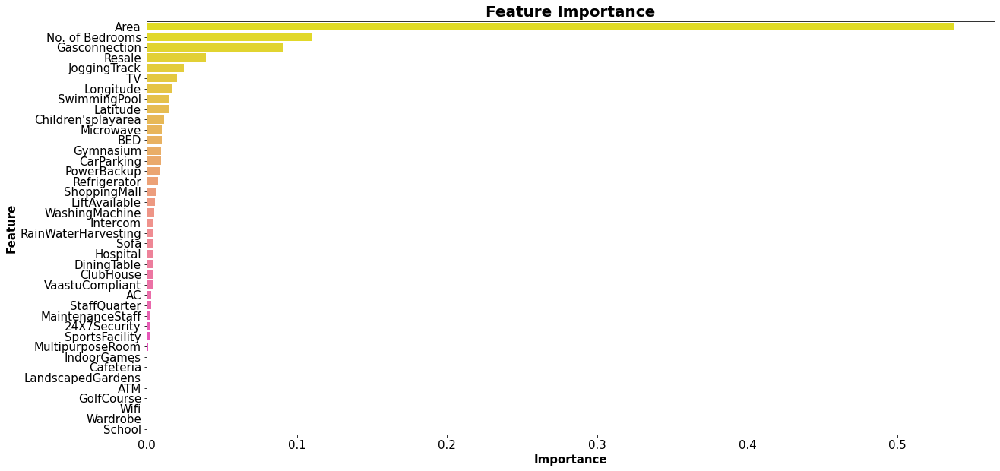

In [88]:

model3.fit(train_X_kolkata, train_y_kolkata)
fi = pd.DataFrame(model3.feature_importances_,
             columns=['importance'])
fi['feature'] = feature_names

fi = fi.sort_values('importance', ascending=False)

plt.figure(figsize=(20, 10))
ax = sns.barplot(data=fi, x='importance', y='feature',
                 palette="spring_r")
ax.tick_params(axis='both', which='both', labelsize=15)
ax.set_xlabel('Importance',fontsize=15, weight="bold");
ax.set_ylabel('Feature',fontsize=15,weight="bold");
plt.title("Feature Importance", size=20, weight="bold");

In [89]:
feature_names_kolkata = ['Area','No. of Bedrooms','Latitude','AC','VaastuCompliant','Longitude','TV']
df_6[feature_names_kolkata]

,Area,No. of Bedrooms,Latitude,AC,VaastuCompliant,Longitude,TV
0,1016,3,22.717624,0,0,88.488953,0
1,1111,2,22.597817,0,0,88.427003,0
2,1020,2,22.621280,0,0,88.485523,0
3,935,2,23.112575,0,0,89.288292,0
4,1956,3,55.955458,0,1,-3.199000,0
...,...,...,...,...,...,...,...
63,1200,2,22.508055,1,0,88.353329,0
64,900,3,22.621280,0,0,88.485523,0
65,750,2,22.621280,0,0,88.485523,0
66,750,2,55.955458,0,0,-3.199000,0


In [90]:
df_6=df_6.loc[:, ~df_6.columns.str.contains('^Unnamed')]
# dataframe1 = df_5.drop([
#        'MaintenanceStaff', 'Gymnasium', 'SwimmingPool', 'LandscapedGardens',
#        'JoggingTrack', 'RainWaterHarvesting', 'IndoorGames', 'ShoppingMall',
#        'Intercom', 'SportsFacility', 'ATM','Cafeteria', 'ClubHouse', 'School',
#        '24X7Security', 'PowerBackup', 'CarParking', 'StaffQuarter',
#         'MultipurposeRoom', 'Hospital', 'WashingMachine',
#        'Resale', 'Wifi', "Children'splayarea",'Gasconnection','TV',
#        'BED', 'Microwave', 'GolfCourse',
#        'DiningTable', 'Sofa', 'Wardrobe', 'Refrigerator', 'City','Location','LiftAvailable' ],axis='columns')

# X_mumbai = dataframe1.drop(['Price'],axis='columns')
# y_mumbai = dataframe1.Price

X_kolkata = df_5[feature_names_kolkata]
y_kolkata = df_5['Price']

train_X_kolkata, val_X_kolkata, train_y_kolkata, val_y_kolkata = train_test_split(X_kolkata, y_kolkata, random_state=1)


train_model(DecisionTreeRegressor(),"Decision Tree Regressor",train_X_kolkata, val_X_kolkata, train_y_kolkata, val_y_kolkata)
train_model(RandomForestRegressor(),"Random Forest Regressor",train_X_kolkata, val_X_kolkata, train_y_kolkata, val_y_kolkata)   
train_model(XGBRegressor(n_estimators=600),"XGBoost Regressor",train_X_kolkata, val_X_kolkata, train_y_kolkata, val_y_kolkata)
find_best_model_using_gridsearchcv(X_kolkata,y_kolkata)


Algorithm - Decision Tree Regressor 
MAE - 22.929348611201082 MSE - 3052.6103340820137 
Accuracy - 94.0%
Algorithm - Random Forest Regressor 
MAE - 26.188008426353715 MSE - 4036.997833063373 
Accuracy - 92.0%
Algorithm - XGBoost Regressor 
MAE - 26.86785853629177 MSE - 6494.970193287646 
Accuracy - 87.0%


,model,best_score,best_params
0,linear_regression,0.462636,{'normalize': True}
1,lasso,0.490113,"{'alpha': 2, 'selection': 'cyclic'}"
2,decision_tree,0.276782,"{'criterion': 'friedman_mse', 'splitter': 'ran..."
